## **Defining ML Model**

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# Input layer with image shape 256x256x3 (RGB image)
inputs = Input(shape=(256, 256, 3), name='input_layer')

# First Convolutional Block
x = Conv2D(32, (3, 3), activation='relu', name='conv1')(inputs)
x = MaxPooling2D(pool_size=(2, 2), name='pool1')(x)

# Second Convolutional Block
x = Conv2D(64, (3, 3), activation='relu', name='conv2')(x)
x = MaxPooling2D(pool_size=(2, 2), name='pool2')(x)

# Third Convolutional Block
x = Conv2D(128, (3, 3), activation='relu', name='conv3')(x)
x = MaxPooling2D(pool_size=(2, 2), name='pool3')(x)

# Flatten the output + Fully connected layers
x = Flatten(name='flatten')(x)
x = Dense(128, activation='relu', name='fc1')(x)
x = Dropout(0.5, name='dropout')(x)  # Dropout to prevent overfitting

# Output Layer - Binary classification (real vs fake)
outputs = Dense(1, activation='sigmoid', name='output')(x)

# Create the model
model = Model(inputs=inputs, outputs=outputs, name='AI_vs_Real_CNN')

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()


Model: "AI_vs_Real_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 254, 254, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool1 (MaxPooling2D)                 │ (None, 127, 127, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2 (Conv2D)                       │ (None, 125, 125, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool2 (MaxPooling2D)                 │ (None, 62, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3 (Conv2D)                       │ (None, 60, 60, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool3 (MaxPooling2D)                 │ (None, 30, 30, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 115200)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ fc1 (Dense)                          │ (None, 128)                 │      14,745,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output (Dense)                       │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,839,105 (56.61 MB)

 Trainable params: 14,839,105 (56.61 MB)

 Non-trainable params: 0 (0.00 B)

# **Explaination of code**

### **Step 1:- Importing Libraries-**

* `import tensorflow as tf`: Imports the TensorFlow library.

    TensorFlow is a powerful framework for building and training machine learning models.

* `from tensorflow.keras.models import Model`: Imports the Model class from tf.keras.
    
    This is used to define a model using the Functional API.

* `from tensorflow.keras.layers import ...`: Imports various types of layers used to build the CNN architecture:

* `Input`: Defines the shape of the input data.

* `Conv2D`: A 2D convolution layer used for feature extraction from images.

* `MaxPooling2D`: Reduces spatial dimensions (downsampling) to reduce computation.

* `Flatten`: Converts 2D feature maps into 1D vector to pass to dense layers.

* `Dense`: Fully connected layer; used for classification.

* `Dropout`: A regularization technique to prevent overfitting.

### **Step 2:- Input Layer**

* **Defines the input shape of your model**: images of size `256x256` with `3` channels (RGB).

* `name='input_layer'` is just a label for easier visualization and debugging.

### **Step 3:- First Convolutional Block**

* `Conv2D(32, (3, 3), activation='relu')`: Applies 32 filters, each of size `3x3`. The activation function is ReLU, which introduces non-linearity.

* `MaxPooling2D(pool_size=(2, 2))`: Reduces the spatial size by taking the max value in each `2x2` block. This helps reduce computation and control overfitting.

### **Step 4:- Second Convolution Block**

* A deeper convolutional layer with `64 filters` to learn more abstract patterns.

* Followed by another pooling layer to further reduce dimensionality.

### **Step 5:- Third Convolution Layer**

* More filters (`128`) to detect even more complex features.

* Another pooling step helps summarize and retain only the most important information.

### **Step 6:- Flatten and Fully Connected Layers**

* `Flatten`: Converts the 3D output from convolutional layers into a 1D vector for the dense layer.

* `Dense(128)`: A fully connected layer with 128 neurons and ReLU activation. It learns to combine features into higher-level representations.

* `Dropout(0.5)`: Randomly sets 50% of neurons to 0 during training to prevent overfitting.

### **Step 7:- Output Layer**

* A **single neuron output** with a `sigmoid` activation function.

Since it’s a **binary classification** (real vs. AI-generated image), sigmoid outputs a probability between 0 and 1.

### **Step 8:- Model Creation**

* Combines all the layers into a **Model** using the Functional API.

* The model is named `AI_vs_Real_CNN`.

### **Step 9:- Model Compilation**

* `optimizer='adam'`: An adaptive optimizer that adjust learning rates automatically for fast convergence.

* `loss='binary_crossentropy'`: Appropriate for binary classification problems.

* `metrics=['accuracy']`: Tracks accuracy while training and evaluting.

### **Step 10:- Model Summary**

* Prints a detailed summary of the model: layer names, output shapes, and number of trainable parameters.

**Summary of Architecture:**
* **Input**: 256x256 RGB image

* **Conv Block 1**: Conv(32) → MaxPool

* **Conv Block 2**: Conv(64) → MaxPool

* **Conv Block 3**: Conv(128) → MaxPool

* **Flatten → Dense(128) → Dropout → Dense(1, Sigmoid)**

## **Building the DataGenerator Function for the Training and Validation**

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# 1. Image normalizing
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

# 2. Train generator
train_generator = train_datagen.flow_from_directory(
    'Dataset/Training',       # <- bas yaha tera correct path
    target_size=(256, 256),      # dynamic resizing
    batch_size=16,
    class_mode='binary'
)

# 3. Validation generator
val_generator = val_datagen.flow_from_directory(
    'Dataset/Validation',         # <- yaha bhi sahi path
    target_size=(256, 256),
    batch_size=16,
    class_mode='binary'
)

Found 24404 images belonging to 2 classes.
Found 10400 images belonging to 2 classes.


# **Explaination of code**

### **Step 1:- Importing Libraries-**

* To import the `ImageDataGenerator` class from Keras — used for:

    * Loading images from directories

    * Applying preprocessing (normalization, augmentation, etc.)

    * Feeding data into the model in real-time (batches)

### **Step 2:- Create Data Generators (with Normalization)**

* To normalize the pixel values of the images by scaling them from **[0, 255]** → **[0, 1]**

    * `rescale=1./255` → Each pixel value is divided by 255

    * Normalization helps in faster convergence and stable training

### **Step 3:- Load Training Images**

* To load training images from the specified directory and convert them into batches for model training.

* **Explanation of parameters:**

    * `'Dataset/Training'`: Folder where training images are stored, grouped in subfolders (one per class)

    * `target_size=(256, 256)`: Resize all images to 256x256 pixels

    * `batch_size=32`: Load 32 images at a time (faster training and reduced memory usage)

    * `class_mode='binary'`: Use binary labels (0 and 1) since we are performing binary classification (Real vs AI)

### **Step 4:- Load Validation Images**

* To load validation images in the same way as training images -- used to **evaluate model performance on unseen data.**

# **Custom Callback for F1 Score Calculation**

In [ ]:
from sklearn.metrics import f1_score
from tensorflow.keras.callbacks import Callback
import numpy as np

class F1ScoreCallback(Callback):
    def __init__(self, val_generator):
        self.val_generator = val_generator
        self.f1_scores = []

    def on_epoch_end(self, epoch, logs=None):
        val_pred = self.model.predict(self.val_generator, verbose=0)
        val_pred_labels = (val_pred > 0.5).astype(int).flatten()
        val_true = self.val_generator.classes[:len(val_pred_labels)]

        f1 = f1_score(val_true, val_pred_labels)
        self.f1_scores.append(f1)
        print(f"\nF1 Score for epoch {epoch+1}: {f1:.4f}")


# **Expalination of Code**

### **Step 1:- Import Required Libraries**

* `f1_score`: From `sklearn.metrics`, it calculates the **F1-score** -- a balance between **precision and recall**, especially useful for imblance datasets.

* `callback`: From Krras -- allows us to create **custom behaviours during training**, like tracking extra metrics.

* `numpy`: Used for efficient nnumerical operations and array handling.

### **Step 2:- Define Custom Callback Class**

* We create a **custom class** `F1ScoreCallback` that inherit from Keras's `callback`.

    This lets us hook into training **at the end of every epoch.**

### **Step 3:- Initilization of the class**

* `val_generator`: Passed when creating an object of this class. It provides validation data for prediction.

* `self.f1_scores`: A list to **store F1 scores** for each epoch, useful for ploting or further analysis.

### **Step 5:- Make Predictions on Validation Set**

* `self.model.predict(...)`: Accesses the model being trained and makes predictions on validation data.

* `verbose=0`: Hides progress bar for cleaner output.

### **Step 6:- Convert Probabilities to Class Labels**

* Since the model outputs **probabilities**, we apply a **threshold of 0.5** to convert to **binary class labels (0 or 1).**

* `.astype(int)`: Converts boolean array to integer format.

* `.flatten()`: Converts shape from (n,1) to (n,) to match the ground truth shape.

### **Step 7:- Get true Labels**

* `.classes`: This gives the true labels for all images in the generator.

    we use slicing `[:len(...)]` to match length with prediction (useful when there's an incomplete last batch).

### **Step 8:- Calculate F1 Score**

* Compute the **F1 Score** using true labels and predicted labels.

### **Step 9:- Save & Print F1 Score**

* Appends the F1 score to the list for tracking.

* Prints it nicely formatted after each epoch.



## **Model Training with Callbacks**

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# 1. EarlyStopping: stop training when val_loss doesn't improve for 3 epochs
early_stop = EarlyStopping(
    monitor='val_loss',            # Track validation Loss
    patience=3,                    # Wait for 3 epochs before stopping (if no improvement)
    restore_best_weights=True,     # Restore weights of the best epoch (not the Last one)
    verbose=1                      # Shows message when early stopping is triggered
)

# 2. ModelCheckpoint: save the best model based on val_accuracy
checkpoint = ModelCheckpoint(
    'Rebuild-model.h5',           # File name to save the best model
    monitor='val_accuracy',       # Track validation accuracy
    mode='max',                   # We want to maximize accuracy
    save_best_only=True,          # Save only the best model, not every epoch
    verbose=1                     # Print message when the is saved
)

# 3. Custom F1 Scores Callback to track F1 score after each epoch
f1_callback = F1ScoreCallback(val_generator)

# 4. Fit the model with all three callbacks
history = model.fit(
    train_generator,                # Training data
    epochs=30,                      # Maximum number of epochs
    validation_data=val_generator,  # Validation data
    callbacks=[early_stop, checkpoint, f1_callback]  # Use all 3 callbacks during training
)

C:\Users\ASUS\tf-env\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
1526/1526 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - accuracy: 0.5798 - loss: 0.6804
Epoch 1: val_accuracy improved from -inf to 0.63077, saving model to Rebuild-model.h5



F1 Score for epoch 1: 0.3734
1526/1526 ━━━━━━━━━━━━━━━━━━━━ 729s 475ms/step - accuracy: 0.5798 - loss: 0.6803 - val_accuracy: 0.6308 - val_loss: 0.6145
Epoch 2/30
1526/1526 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step - accuracy: 0.6687 - loss: 0.5814
Epoch 2: val_accuracy improved from 0.63077 to 0.66163, saving model to Rebuild-model.h5



F1 Score for epoch 2: 0.5054
1526/1526 ━━━━━━━━━━━━━━━━━━━━ 637s 417ms/step - accuracy: 0.6687 - loss: 0.5814 - val_accuracy: 0.6616 - val_loss: 0.5888
Epoch 3/30
1526/1526 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step - accuracy: 0.7071 - loss: 0.5349
Epoch 3: val_accuracy did not improve from 0.66163

F1 Score for epoch 3: 0.5496
1526/1526 ━━━━━━━━━━━━━━━━━━━━ 600s 393ms/step - accuracy: 0.7071 - loss: 0.5349 - val_accuracy: 0.6581 - val_loss: 0.5891
Epoch 4/30
1526/1526 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step - accuracy: 0.7390 - loss: 0.4922
Epoch 4: val_accuracy improved from 0.66163 to 0.67279, saving model to Rebuild-model.h5



F1 Score for epoch 4: 0.4986
1526/1526 ━━━━━━━━━━━━━━━━━━━━ 555s 364ms/step - accuracy: 0.7390 - loss: 0.4922 - val_accuracy: 0.6728 - val_loss: 0.5961
Epoch 5/30
1526/1526 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step - accuracy: 0.7865 - loss: 0.4290
Epoch 5: val_accuracy improved from 0.67279 to 0.67423, saving model to Rebuild-model.h5



F1 Score for epoch 5: 0.5264
1526/1526 ━━━━━━━━━━━━━━━━━━━━ 545s 357ms/step - accuracy: 0.7865 - loss: 0.4290 - val_accuracy: 0.6742 - val_loss: 0.6196
Epoch 5: early stopping
Restoring model weights from the end of the best epoch: 2.


# **Explanation of Code**

### **Step 1:- Imports essential Keras callbacks**

* `EarlyStopping`: Stops training when the model stops improving on the validation data.

* `ModelCheckpoints`: Saves the best-performing model during training.

### **Step 2:- EarlyStopping**

* Prevents overfitting and unnecessary training when the model has stopped improving.

### **Step 3:- ModelCheckpoint**

* Saves the best model (with highest validation accuracy) so we can use it later without retraining.

### **Step 4:- F1ScoreCallback**

* Tracks and prints the **F1 score** on the validation set after every epoch -- useful especially for **imbalanced datasets.**

### **Step 5:- Training**

* This is when model training happens. We pass in:

    * **Training and validation data**
    * **Maximum epochs (30)**
    * A **list of callbacks** that:
        * Stops training early if no improvement (`EarlyStopping`)
        * Saves the best model (`ModelCheckpoint`)
        * Prints F1 scores after each epoch (`F1ScoresCallback`)

## **Building the DataGenerator Function for the Testing**

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Assuming 'test_dir' is the directory containing test data
test_datagen = ImageDataGenerator(rescale=1./255)  # Normalization

test_generator = test_datagen.flow_from_directory(
    'Dataset/Testing',       # Your test dataset path
    target_size=(256, 256),         # Make sure it matches your training size
    batch_size=16,
    class_mode='binary',             # ✅ For binary classification (real vs fake)
    shuffle=False                   # Keep this False for accurate prediction order
)


Found 9200 images belonging to 2 classes.


## **Evaluate the Model**

In [ ]:
# 2. Evaluate the model
loss, accuracy = model.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy * 100:.2f}%")


C:\Users\ASUS\tf-env\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


575/575 ━━━━━━━━━━━━━━━━━━━━ 95s 165ms/step - accuracy: 0.6646 - loss: 0.5870
Test Loss: 0.6083
Test Accuracy: 64.93%


## **Plot the confusion Matrix and Classification Report**

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

# 1. Get predictions (probabilities from sigmoid)
y_pred = model.predict(test_generator, steps=test_generator.samples // test_generator.batch_size)

# 2. Convert probabilities to class labels using threshold 0.5
y_pred_classes = (y_pred > 0.5).astype(int).flatten()

# 3. Get true labels from the generator
y_true = test_generator.classes[:len(y_pred_classes)]  # Slice to match size if needed

# 4. Compute confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)
print("Confusion Matrix:")
print(cm)

# 5. Compute classification report (includes precision, recall, f1-score)
cr = classification_report(y_true, y_pred_classes, target_names=test_generator.class_indices.keys())
print("Classification Report:")
print(cr)


575/575 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step
Confusion Matrix:
[[2947 1653]
 [1573 3027]]
Classification Report:
              precision    recall  f1-score   support

        fake       0.65      0.64      0.65      4600
        real       0.65      0.66      0.65      4600

    accuracy                           0.65      9200
   macro avg       0.65      0.65      0.65      9200
weighted avg       0.65      0.65      0.65      9200



575/575 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step


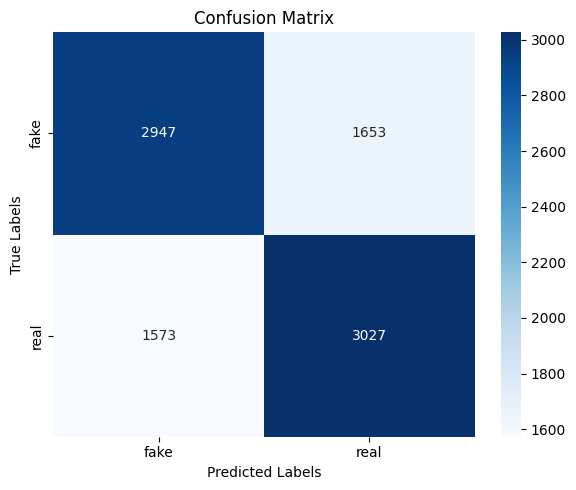

Classification Report:
               precision    recall  f1-score   support

        fake       0.65      0.64      0.65      4600
        real       0.65      0.66      0.65      4600

    accuracy                           0.65      9200
   macro avg       0.65      0.65      0.65      9200
weighted avg       0.65      0.65      0.65      9200



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# 1. Get predictions
y_pred = model.predict(test_generator, steps=test_generator.samples // test_generator.batch_size)
y_pred_classes = (y_pred > 0.5).astype(int).flatten()

# 2. True labels
y_true = test_generator.classes[:len(y_pred_classes)]

# 3. Confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# 4. Class names (based on folder names)
class_names = list(test_generator.class_indices.keys())  # e.g. ['fake', 'real']

# 5. Plot and save confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)

plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.tight_layout()

# Save the plot
plt.savefig("confusion_matrix.png")   # ✅ Saves the plot as PNG file
plt.show()

# 6. Classification report
cr = classification_report(y_true, y_pred_classes, target_names=class_names)
print("Classification Report:\n", cr)


## **Plot the confusion Matrix and Evaluation Metrics per Class**

575/575 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step


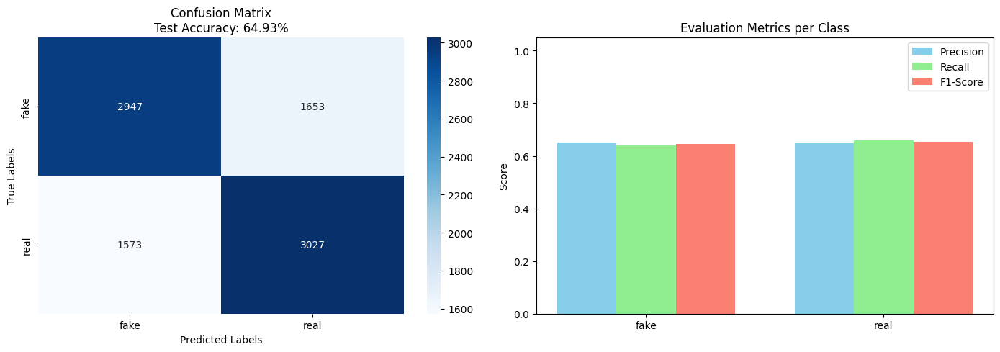

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# 1. Get predictions
y_pred = model.predict(test_generator, steps=test_generator.samples // test_generator.batch_size)
y_pred_classes = (y_pred > 0.5).astype(int).flatten()

# 2. True labels
y_true = test_generator.classes[:len(y_pred_classes)]

# 3. Class names
class_names = list(test_generator.class_indices.keys())

# 4. Confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# 5. Classification report as dict
report = classification_report(y_true, y_pred_classes, target_names=class_names, output_dict=True)

# 6. Extract metrics for each class
labels = class_names
precision = [report[label]['precision'] for label in labels]
recall = [report[label]['recall'] for label in labels]
f1_score = [report[label]['f1-score'] for label in labels]

# 7. Calculate test accuracy
test_accuracy = report['accuracy'] * 100  # In percent

# 8. Create the combined plot
fig, axs = plt.subplots(1, 2, figsize=(14, 5))

# ---- Left: Confusion Matrix ----
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=axs[0])
axs[0].set_title(f'Confusion Matrix\nTest Accuracy: {test_accuracy:.2f}%', fontsize=12)
axs[0].set_xlabel('Predicted Labels')
axs[0].set_ylabel('True Labels')

# ---- Right: Bar Chart of Metrics ----
x = np.arange(len(labels))
width = 0.25

axs[1].bar(x - width, precision, width, label='Precision', color='skyblue')
axs[1].bar(x, recall, width, label='Recall', color='lightgreen')
axs[1].bar(x + width, f1_score, width, label='F1-Score', color='salmon')

axs[1].set_title('Evaluation Metrics per Class')
axs[1].set_xticks(x)
axs[1].set_xticklabels(labels)
axs[1].set_ylim(0, 1.05)
axs[1].legend()
axs[1].set_ylabel('Score')

# ---- Layout and Save ----
plt.tight_layout()
plt.savefig("metrics_summary.png")  # ✅ Combined image with accuracy
plt.show()


575/575 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step


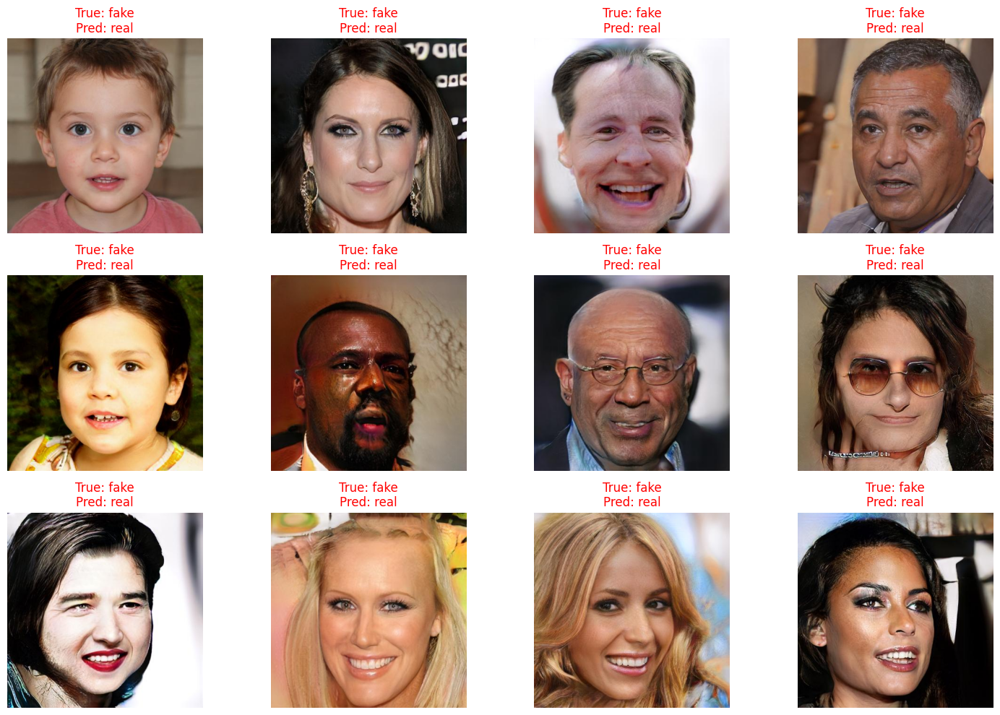

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Predict on test data
y_pred = model.predict(test_generator, steps=test_generator.samples // test_generator.batch_size)
y_pred_classes = (y_pred > 0.5).astype(int).flatten()

# 2. True labels and file paths
y_true = test_generator.classes[:len(y_pred_classes)]
file_paths = test_generator.filepaths[:len(y_pred_classes)]

# 3. Class names
class_names = list(test_generator.class_indices.keys())
index_to_class = {v: k for k, v in test_generator.class_indices.items()}

# 4. Find misclassified indices
misclassified_indices = np.where(y_pred_classes != y_true)[0]

# Limit to first 12 for plotting
num_samples = min(12, len(misclassified_indices))
sample_indices = misclassified_indices[:num_samples]

# 5. Plot misclassified images
plt.figure(figsize=(15, 10))

for i, idx in enumerate(sample_indices):
    img = plt.imread(file_paths[idx])  # Read image from path
    true_label = index_to_class[y_true[idx]]
    pred_label = index_to_class[y_pred_classes[idx]]

    plt.subplot(3, 4, i + 1)
    plt.imshow(img)
    plt.title(f"True: {true_label}\nPred: {pred_label}", color='red')
    plt.axis('off')

plt.tight_layout()
plt.savefig("misclassified_samples.png")  # ✅ Save the figure
plt.show()


575/575 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step


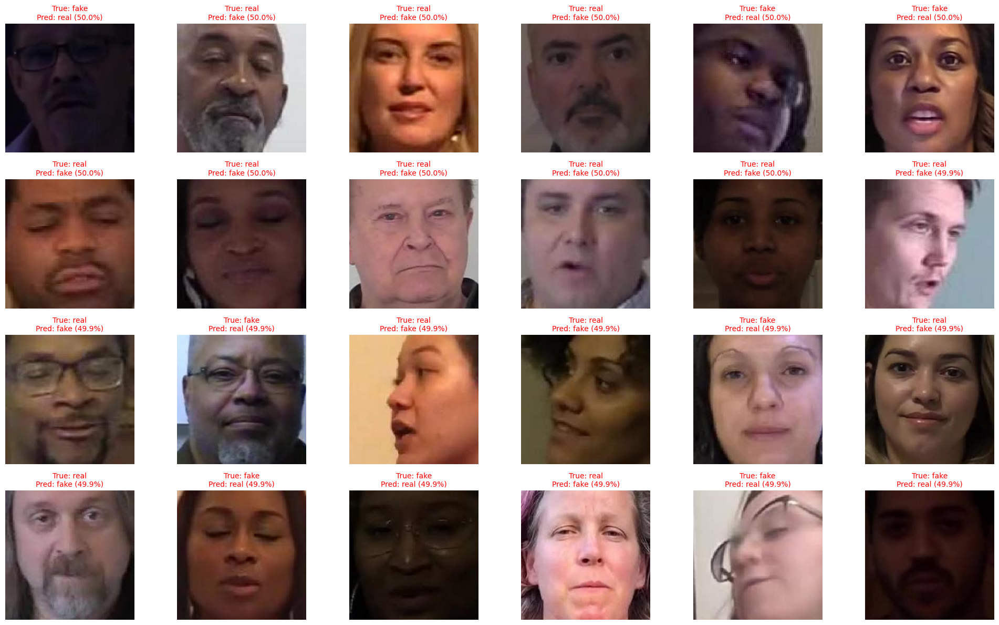

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# 1. Predict on test set
y_pred_probs = model.predict(test_generator, steps=test_generator.samples // test_generator.batch_size).flatten()
y_pred_classes = (y_pred_probs > 0.5).astype(int)

# 2. True labels and file paths
y_true = test_generator.classes[:len(y_pred_classes)]
file_paths = test_generator.filepaths[:len(y_pred_classes)]

# 3. Class name mappings
class_names = list(test_generator.class_indices.keys())
index_to_class = {v: k for k, v in test_generator.class_indices.items()}

# 4. Identify misclassified indices
misclassified = np.where(y_pred_classes != y_true)[0]

# 5. Sort misclassified by worst confidence (closest to 0.5)
confidence_scores = np.abs(y_pred_probs - 0.5)
sorted_indices = misclassified[np.argsort(confidence_scores[misclassified])]

# 6. Choose top N misclassified samples
num_samples = min(24, len(sorted_indices))
sample_indices = sorted_indices[:num_samples]

# 7. Plot the misclassified images
plt.figure(figsize=(20, 12))

for i, idx in enumerate(sample_indices):
    img = mpimg.imread(file_paths[idx])
    true_label = index_to_class[y_true[idx]]
    pred_label = index_to_class[y_pred_classes[idx]]
    confidence = y_pred_probs[idx]
    confidence_percent = confidence * 100 if pred_label == 'fake' else (100 - confidence * 100)

    plt.subplot(4, 6, i + 1)
    plt.imshow(img)
    plt.title(f"True: {true_label}\nPred: {pred_label} ({confidence_percent:.1f}%)", fontsize=10, color='red')
    plt.axis('off')

plt.tight_layout()
plt.savefig("misclassified_samples2.png")  # ✅ Save the enhanced figure
plt.show()


575/575 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step
✅ Saved CSV: prediction_report.csv


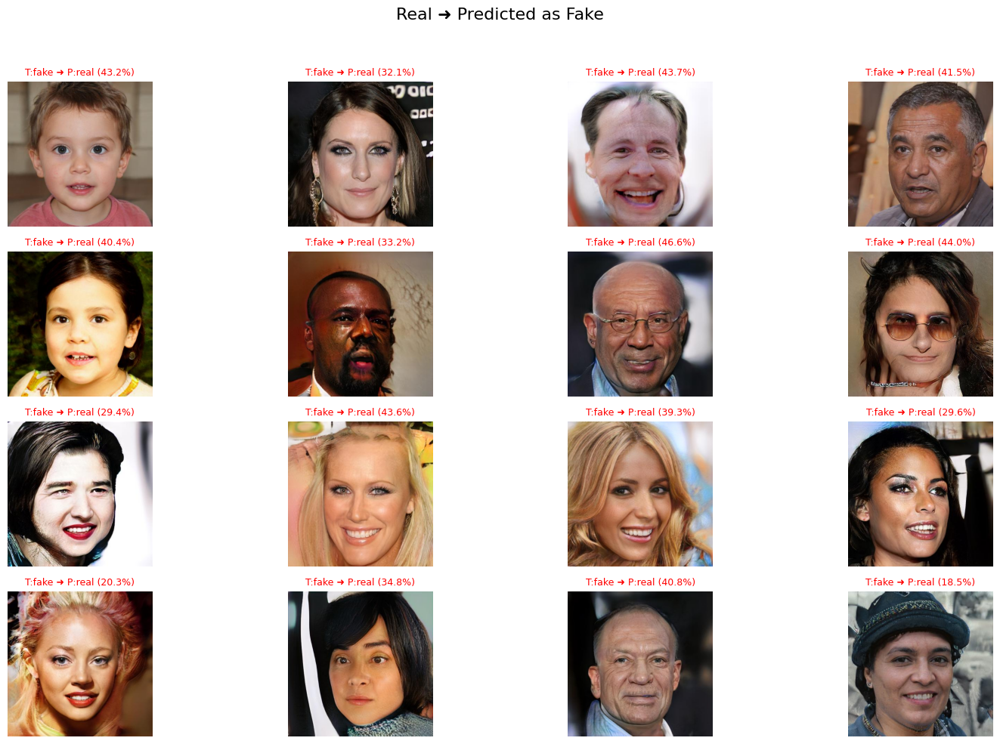

✅ Saved: real_as_fake.png


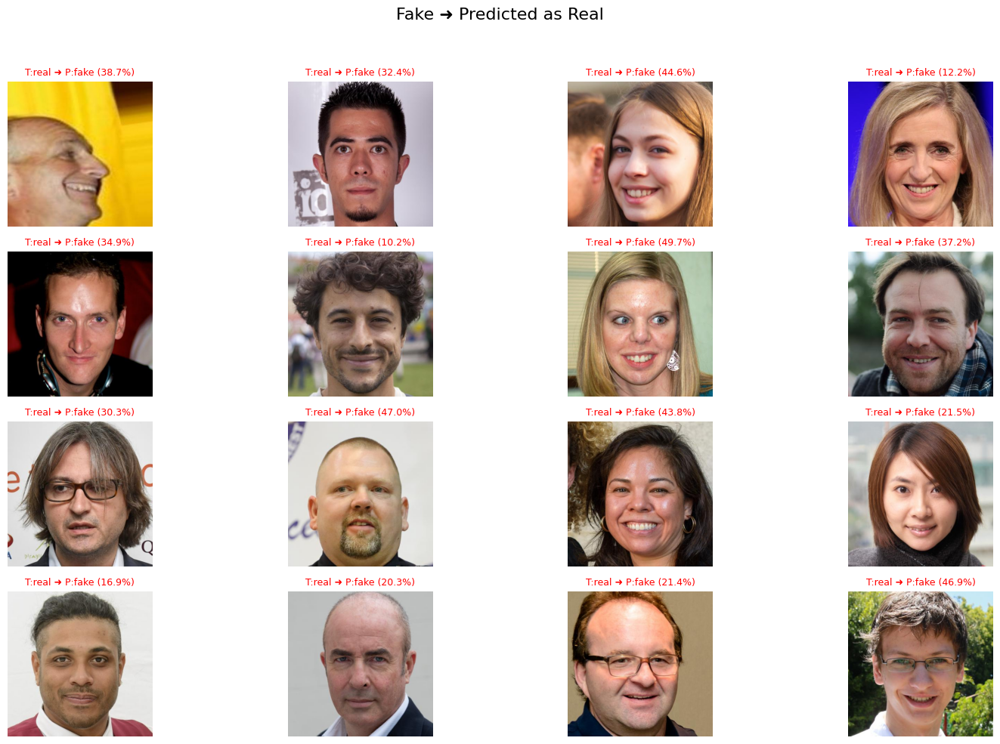

✅ Saved: fake_as_real.png


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# 1. Predictions
y_pred_probs = model.predict(test_generator, steps=test_generator.samples // test_generator.batch_size).flatten()
y_pred_classes = (y_pred_probs > 0.5).astype(int)

# 2. Labels and paths
y_true = test_generator.classes[:len(y_pred_classes)]
file_paths = test_generator.filepaths[:len(y_pred_classes)]

# 3. Class mappings
class_names = list(test_generator.class_indices.keys())
index_to_class = {v: k for k, v in test_generator.class_indices.items()}

# 4. Create CSV data
data = []
for i in range(len(file_paths)):
    file_name = os.path.basename(file_paths[i])
    true_label = index_to_class[y_true[i]]
    pred_label = index_to_class[y_pred_classes[i]]
    confidence = y_pred_probs[i]
    pred_conf = confidence if pred_label == "fake" else (1 - confidence)

    data.append([file_name, true_label, pred_label, round(pred_conf * 100, 2)])

# Save to CSV
df = pd.DataFrame(data, columns=["Filename", "True_Label", "Predicted_Label", "Confidence (%)"])
df.to_csv("prediction_report.csv", index=False)
print("✅ Saved CSV: prediction_report.csv")

# 5. Find specific misclassifications
real_as_fake = []
fake_as_real = []

for i in range(len(y_true)):
    if y_true[i] == 0 and y_pred_classes[i] == 1:  # Real -> Fake
        real_as_fake.append(i)
    elif y_true[i] == 1 and y_pred_classes[i] == 0:  # Fake -> Real
        fake_as_real.append(i)

# 6. Function to plot and save misclassified image grid
def plot_misclassified(indices, title, filename):
    num_samples = min(16, len(indices))
    sample_indices = indices[:num_samples]

    plt.figure(figsize=(16, 10))
    for i, idx in enumerate(sample_indices):
        img = mpimg.imread(file_paths[idx])
        true_label = index_to_class[y_true[idx]]
        pred_label = index_to_class[y_pred_classes[idx]]
        conf = y_pred_probs[idx]
        conf_percent = conf * 100 if pred_label == 'fake' else (100 - conf * 100)

        plt.subplot(4, 4, i + 1)
        plt.imshow(img)
        plt.title(f"T:{true_label} ➜ P:{pred_label} ({conf_percent:.1f}%)", fontsize=9, color='red')
        plt.axis('off')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(filename)
    plt.show()
    print(f"✅ Saved: {filename}")

# 7. Plot and save both sets
plot_misclassified(real_as_fake, "Real ➜ Predicted as Fake", "real_as_fake.png")
plot_misclassified(fake_as_real, "Fake ➜ Predicted as Real", "fake_as_real.png")


In [ ]:
model.save('best_model.h5')  # Already using this in your ModelCheckpoint
model.save('my_model.keras')  # Directory-based format

model.save_weights('model_weights.weights.h5')     # Save only weights
model.load_weights('model_weights.weights.h5')     # Load into same architecture


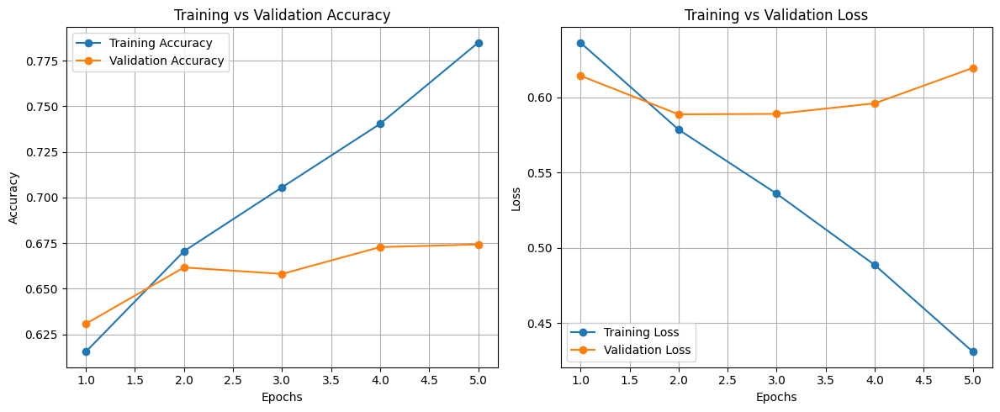

In [ ]:
import matplotlib.pyplot as plt

# Extract values
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(1, len(acc) + 1)

# Plot
plt.figure(figsize=(12, 5))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy', marker='o')
plt.plot(epochs_range, val_acc, label='Validation Accuracy', marker='o')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss Plot
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss', marker='o')
plt.plot(epochs_range, val_loss, label='Validation Loss', marker='o')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig("training_graph.png")  # ✅ Save the plot as image
plt.show()


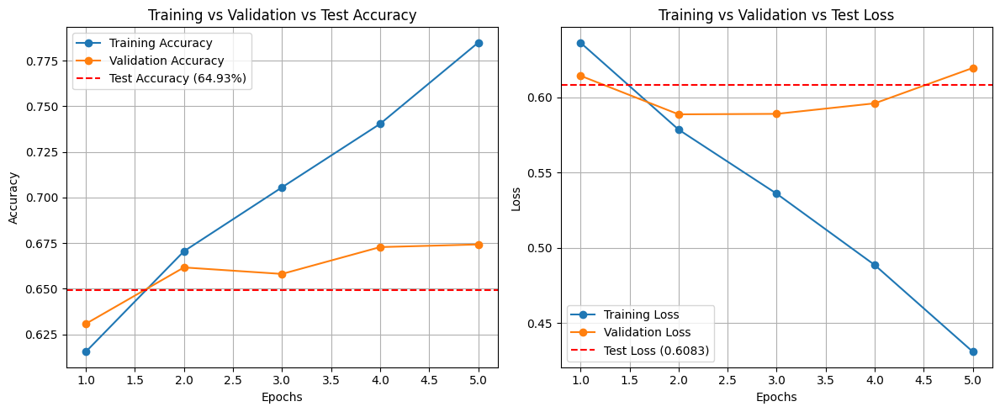

In [ ]:
import matplotlib.pyplot as plt

# Extract values
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss_values = history.history['loss']
val_loss_values = history.history['val_loss']
epochs_range = range(1, len(acc) + 1)

# 🔽 Your test metrics (replace with your actual test values)
test_accuracy = 0.6493   # ← 48.99%
test_loss = 0.6083       # ← example, replace with actual loss if known

# Plotting
plt.figure(figsize=(12, 5))

# --- Accuracy Plot ---
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy', marker='o')
plt.plot(epochs_range, val_acc, label='Validation Accuracy', marker='o')
plt.axhline(y=test_accuracy, color='red', linestyle='--', label=f'Test Accuracy ({test_accuracy*100:.2f}%)')
plt.title('Training vs Validation vs Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# --- Loss Plot ---
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss_values, label='Training Loss', marker='o')
plt.plot(epochs_range, val_loss_values, label='Validation Loss', marker='o')
plt.axhline(y=test_loss, color='red', linestyle='--', label=f'Test Loss ({test_loss:.4f})')
plt.title('Training vs Validation vs Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig("training_validation_test_graph.png")  # ✅ Save the combined graph
plt.show()


575/575 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - accuracy: 0.6646 - loss: 0.5870
Test Accuracy: 64.93%
Test Loss: 0.6083


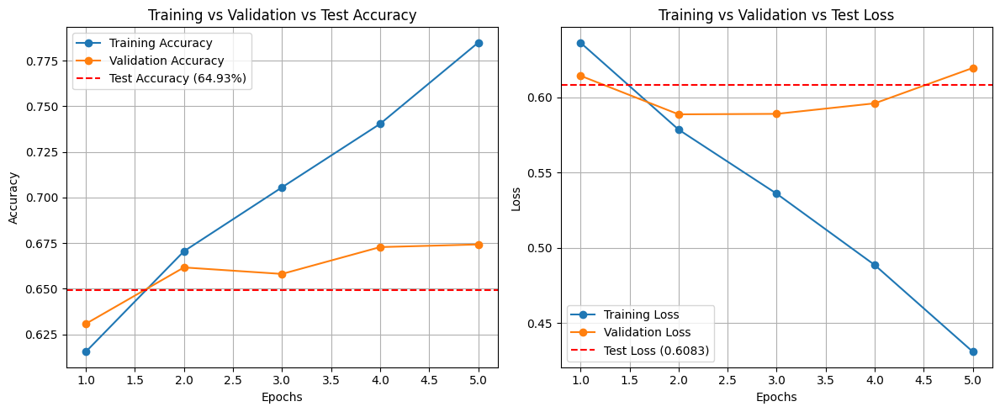

In [ ]:
import matplotlib.pyplot as plt

# 1. Evaluate model on test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy*100:.2f}%")
print(f"Test Loss: {test_loss:.4f}")

# 2. Extract training/validation data
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss_values = history.history['loss']
val_loss_values = history.history['val_loss']
epochs_range = range(1, len(acc) + 1)

# 3. Plotting
plt.figure(figsize=(12, 5))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy', marker='o')
plt.plot(epochs_range, val_acc, label='Validation Accuracy', marker='o')
plt.axhline(y=test_accuracy, color='red', linestyle='--', label=f'Test Accuracy ({test_accuracy*100:.2f}%)')
plt.title('Training vs Validation vs Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss Plot
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss_values, label='Training Loss', marker='o')
plt.plot(epochs_range, val_loss_values, label='Validation Loss', marker='o')
plt.axhline(y=test_loss, color='red', linestyle='--', label=f'Test Loss ({test_loss:.4f})')
plt.title('Training vs Validation vs Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig("training_validation_test_graph2.png")
plt.show()


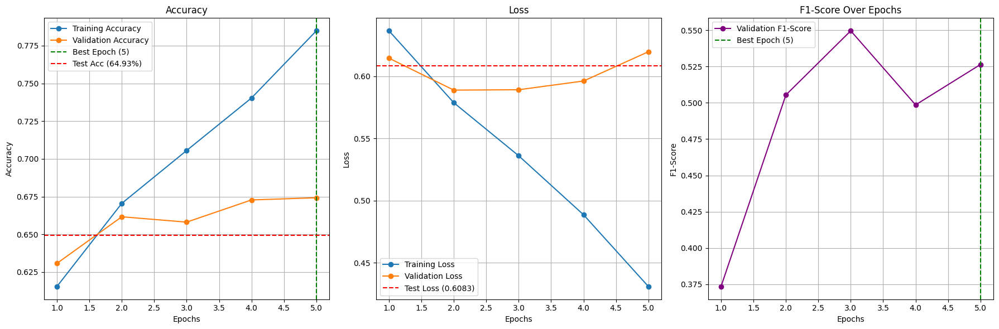

In [ ]:
import matplotlib.pyplot as plt

# Get training/validation history
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss_values = history.history['loss']
val_loss_values = history.history['val_loss']
epochs = range(1, len(acc) + 1)

# Evaluate on test set
test_loss, test_accuracy = model.evaluate(test_generator, verbose=0)

# Get F1-scores
f1_scores = f1_callback.f1_scores

# Find best epoch (highest val_acc)
best_epoch = np.argmax(val_acc) + 1
best_val_acc = max(val_acc)

# Plotting
plt.figure(figsize=(18, 6))

# 1. Accuracy plot
plt.subplot(1, 3, 1)
plt.plot(epochs, acc, label='Training Accuracy', marker='o')
plt.plot(epochs, val_acc, label='Validation Accuracy', marker='o')
plt.axvline(x=best_epoch, color='green', linestyle='--', label=f'Best Epoch ({best_epoch})')
plt.axhline(y=test_accuracy, color='red', linestyle='--', label=f'Test Acc ({test_accuracy*100:.2f}%)')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# 2. Loss plot
plt.subplot(1, 3, 2)
plt.plot(epochs, loss_values, label='Training Loss', marker='o')
plt.plot(epochs, val_loss_values, label='Validation Loss', marker='o')
plt.axhline(y=test_loss, color='red', linestyle='--', label=f'Test Loss ({test_loss:.4f})')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# 3. F1-Score plot
plt.subplot(1, 3, 3)
plt.plot(epochs, f1_scores, label='Validation F1-Score', color='purple', marker='o')
plt.axvline(x=best_epoch, color='green', linestyle='--', label=f'Best Epoch ({best_epoch})')
plt.title('F1-Score Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('F1-Score')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig("full_training_metrics.png")
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model

# Load your trained model once
model = load_model("best_model.h5")

def predict_image(img_path):
    """
    Predicts whether the image is Real or Fake using the trained model.
    Displays the image along with the prediction and confidence score.

    Args:
        img_path (str): Path to the input image
    """
    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(256, 256))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0  # normalize

    # Make prediction
    prediction = model.predict(img_array)[0][0]
    label = "Fake" if prediction > 0.5 else "Real"
    confidence = prediction if prediction > 0.5 else 1 - prediction

    # Show the image with prediction
    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"{label} ({confidence * 100:.2f}%)", fontsize=14, color='blue')
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


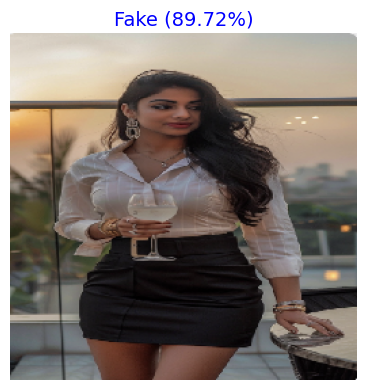

In [ ]:
predict_image("test image.png")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


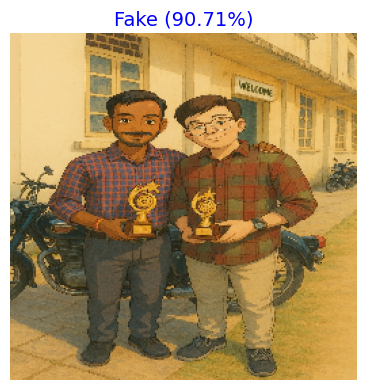

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


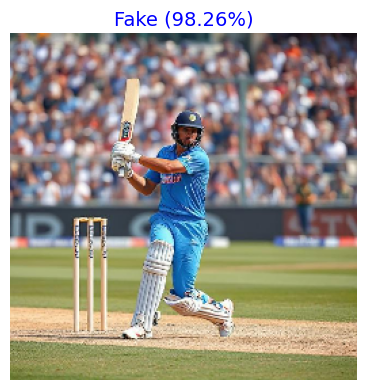

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


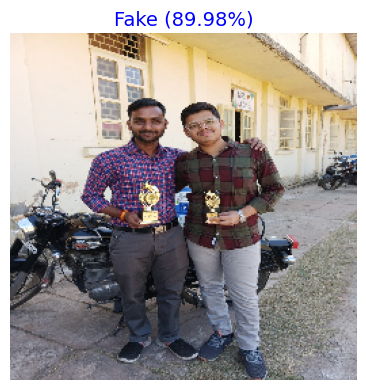

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


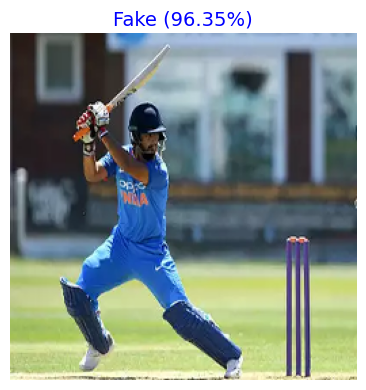

In [ ]:
predict_image("ai test image.jpg")
predict_image("ai test image2.png")
predict_image("real test image.jpg")
predict_image("real test image2.png")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


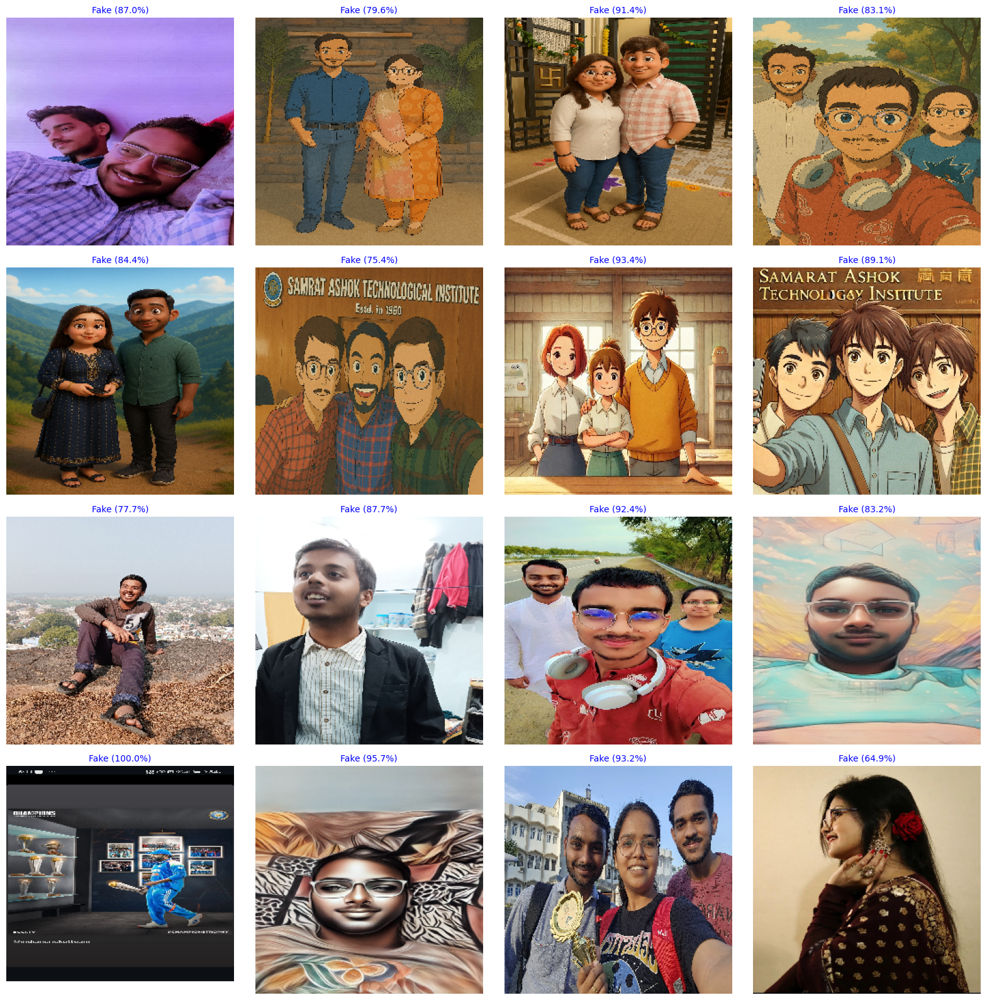

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model

# --- 1. Load your trained model ---
model = load_model("best_model.h5")

# --- 2. Folder containing test images ---
folder_path = "test images"  # 👈 Replace with your folder of test images
image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# --- 3. Predict & collect results ---
results = []

for fname in image_files:
    img_path = os.path.join(folder_path, fname)
    img = image.load_img(img_path, target_size=(256, 256))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0

    pred = model.predict(img_array)[0][0]

    label = "Fake" if pred > 0.5 else "Real"
    confidence = pred if pred > 0.5 else 1 - pred

    results.append((img, label, confidence, fname))

# --- 4. Plotting the images and results ---
num_images = len(results)
cols = 4
rows = (num_images // cols) + int(num_images % cols != 0)

plt.figure(figsize=(4 * cols, 4 * rows))

for i, (img, label, confidence, fname) in enumerate(results):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"{label} ({confidence*100:.1f}%)", fontsize=10, color='blue')

plt.tight_layout()
plt.savefig("Testing_Accuracy.png")
plt.show()
